# Step A: Multi-Product Detection on Store Shelves

In this notebook, we will implement an object detection pipeline using ORB features and homography  
to recognize multiple cereal boxes in shelf images.

**Outline:**
1. Import dependencies  
2. Configure paths and ORB parameters  
3. Extract features and match  
4. Filter matches and estimate homography  
5. Compute bounding boxes (center, width, height)  
6. Visualize results

In [46]:
# 1. Import dependencies
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
# Enable inline plotting
%matplotlib inline


## 2. Configuration

- `REF_DIR`: Folder containing reference images (`models/`)  
- `SCENE_DIR`: Folder containing scene images (`scenes/`)  
- `MAX_FEATURES`: Maximum number of ORB keypoints to detect  
- `GOOD_MATCH_RATIO`: Lowe’s ratio threshold for good matches


In [47]:
# 2. Set paths and SIFT parameters
REF_DIR = 'models'
SCENE_DIR = 'scenes'
REF_FILES = [
    "0.jpg", "1.jpg", "11.jpg", "19.jpg",
    "24.jpg", "25.jpg", "26.jpg"
]

MAX_FEATURES    = 0      # unused by SIFT
GOOD_MATCH_RATIO = 0.75  # Lowe’s ratio
MIN_MATCHES      = 8
MIN_INLIERS      = 15

# Initialize SIFT detector + L2 brute‑force matcher
sift = cv2.SIFT_create()                  
bf   = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

## 3. Feature Extraction and Matching

Define two helper functions:
- `detect_and_compute(img)`: detect ORB keypoints & compute descriptors  
- `match_features(des1, des2, ratio)`: match descriptors via k‑NN and apply Lowe’s ratio test


In [48]:
# 3. Define feature extraction and matching functions with SIFT

def detect_and_compute(img):
    """
    Detect SIFT keypoints and compute descriptors.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = sift.detectAndCompute(gray, None)
    return kp, des

def match_features(des1, des2, ratio=GOOD_MATCH_RATIO):
    """
    Match descriptors using k-NN and apply Lowe's ratio test.
    Returns a list of good matches.
    """
    matches = bf.knnMatch(des1, des2, k=2)
    good = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good.append(m)
    return good

## 4. Homography Estimation & Bounding Box Calculation

Function `detect_instances` will:
1. Extract & match features between reference and scene  
2. Check for at least `min_matches` good matches  
3. Estimate homography via RANSAC  
4. Project reference corners into the scene  
5. Compute bounding‑box center, width, height


In [49]:
# 4. Define instance detection function with debug
def detect_instances(ref_img, scene_img, min_inliers=MIN_INLIERS):
    """
    Try to find exactly one instance of ref_img in scene_img.
    Returns (center, (w,h), corners, inliers) if inliers>=min_inliers, else None.
    """
    # extract features
    ref_kp, ref_des     = detect_and_compute(ref_img)
    scene_kp, scene_des = detect_and_compute(scene_img)

    # match + ratio test
    matches = bf.knnMatch(ref_des, scene_des, k=2)
    good    = [m for m,n in matches if m.distance < GOOD_MATCH_RATIO * n.distance]
    if len(good) < 8:         # quick pre‐filter  
        return None

    # homography
    src_pts = np.float32([ref_kp[m.queryIdx].pt for m in good]).reshape(-1,1,2)
    dst_pts = np.float32([scene_kp[m.trainIdx].pt for m in good]).reshape(-1,1,2)
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    if H is None:
        return None

    inliers = int(mask.sum())
    if inliers < min_inliers:
        return None

    # project corners
    h_ref, w_ref = ref_img.shape[:2]
    corners0 = np.float32([[0,0],[w_ref,0],[w_ref,h_ref],[0,h_ref]]).reshape(-1,1,2)
    proj_c   = cv2.perspectiveTransform(corners0, H).reshape(-1,2)
    x_min, y_min = proj_c.min(axis=0)
    x_max, y_max = proj_c.max(axis=0)
    w_box, h_box = x_max-x_min, y_max-y_min
    center = (x_min + w_box/2, y_min + h_box/2)

    return center, (w_box, h_box), proj_c, inliers

    """
    Detect instances of ref_img within scene_img.
    Prints number of good matches for debugging.
    Returns a list of tuples: (center, (width, height), projected_corners).
    """
    # 1) Extract features
    ref_kp, ref_des = detect_and_compute(ref_img)
    scene_kp, scene_des = detect_and_compute(scene_img)
    
    # 2) Match and filter
    good = match_features(ref_des, scene_des)
    print(f"    Found {len(good)} good matches")  # debug
    
    # 3) Check threshold
    if len(good) < min_matches:
        return []
    
    # 4) Prepare points for homography
    src_pts = np.float32([ref_kp[m.queryIdx].pt for m in good]).reshape(-1,1,2)
    dst_pts = np.float32([scene_kp[m.trainIdx].pt for m in good]).reshape(-1,1,2)
    
    # 5) Estimate homography
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    if H is None:
        return []
    
    # 6) Project corners and compute bbox
    h_ref, w_ref = ref_img.shape[:2]
    corners = np.float32([[0,0], [w_ref,0], [w_ref,h_ref], [0,h_ref]]).reshape(-1,1,2)
    proj_corners = cv2.perspectiveTransform(corners, H).reshape(-1,2)
    x_min, y_min = proj_corners.min(axis=0)
    x_max, y_max = proj_corners.max(axis=0)
    w_box, h_box = x_max - x_min, y_max - y_min
    center = (x_min + w_box/2, y_min + h_box/2)
    
    return [(center, (w_box, h_box), proj_corners)]


## 5. Execution & Visualization

Loop over all scenes, detect each reference, draw bounding boxes, and display both  
the annotated image and detection details in the console.


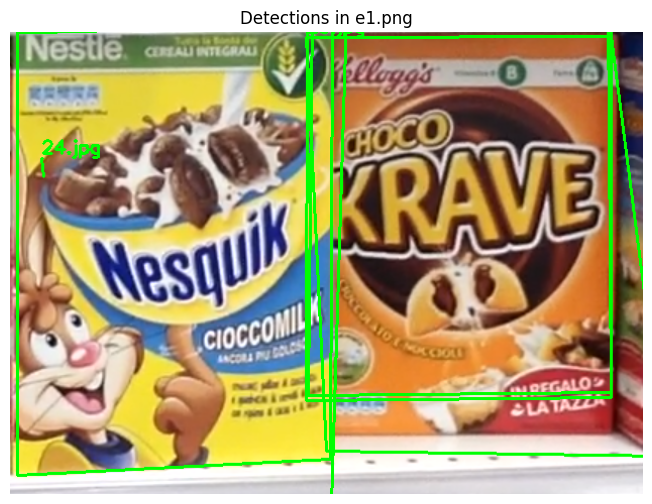

Product 0.jpg: inliers=309, center=(163.2,217.6), w=311.6px, h=444.0px
Product 1.jpg: inliers=102, center=(445.3,167.1), w=300.2px, h=386.5px
Product 11.jpg: inliers=89, center=(444.6,168.5), w=301.8px, h=393.8px
Product 24.jpg: inliers=36, center=(32.7,134.3), w=1.7px, h=18.2px
Product 25.jpg: inliers=26, center=(471.1,212.3), w=355.9px, h=416.6px
Product 26.jpg: inliers=52, center=(101.1,303.3), w=464.0px, h=670.9px


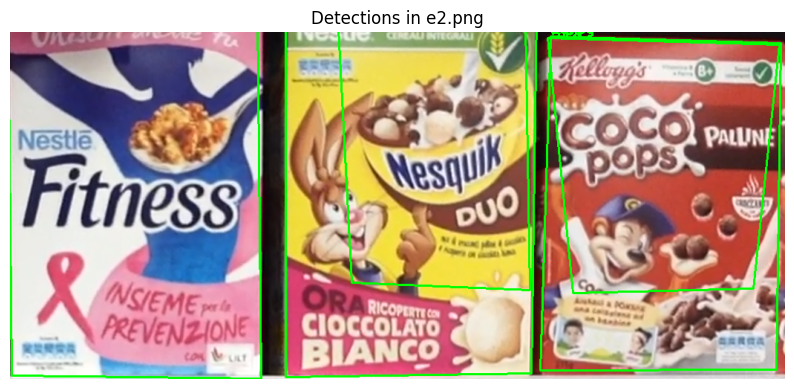

Product 0.jpg: inliers=42, center=(571.6,168.7), w=258.0px, h=359.1px
Product 1.jpg: inliers=33, center=(880.8,180.9), w=311.8px, h=342.4px
Product 24.jpg: inliers=239, center=(167.7,219.1), w=341.3px, h=496.4px
Product 25.jpg: inliers=153, center=(876.8,231.8), w=324.1px, h=449.3px
Product 26.jpg: inliers=281, center=(540.6,219.3), w=338.0px, h=491.6px


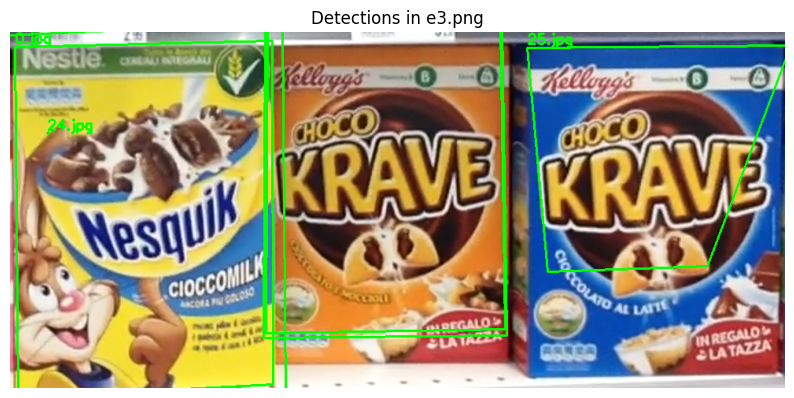

Product 0.jpg: inliers=236, center=(170.6,238.6), w=327.7px, h=452.9px
Product 1.jpg: inliers=58, center=(477.5,186.8), w=303.4px, h=393.0px
Product 11.jpg: inliers=46, center=(477.1,190.2), w=309.5px, h=398.6px
Product 24.jpg: inliers=17, center=(48.5,129.5), w=2.6px, h=2.7px
Product 25.jpg: inliers=28, center=(825.3,161.7), w=334.6px, h=286.8px
Product 26.jpg: inliers=35, center=(130.8,300.5), w=441.7px, h=623.2px


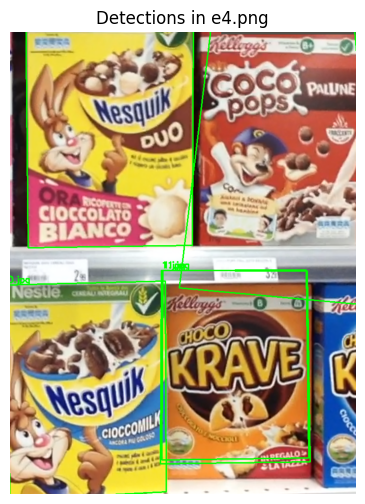

Product 0.jpg: inliers=219, center=(158.6,741.6), w=327.6px, h=453.0px
Product 1.jpg: inliers=116, center=(465.1,689.3), w=302.5px, h=392.7px
Product 11.jpg: inliers=90, center=(464.9,693.8), w=309.0px, h=399.9px
Product 25.jpg: inliers=120, center=(556.4,276.8), w=413.2px, h=581.4px
Product 26.jpg: inliers=198, center=(205.3,196.7), w=345.8px, h=499.1px


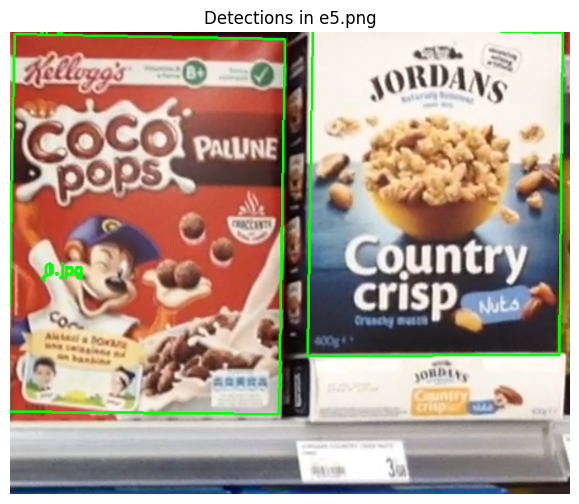

Product 0.jpg: inliers=25, center=(41.0,293.7), w=1.7px, h=1.7px
Product 1.jpg: inliers=40, center=(40.6,290.1), w=5.9px, h=4.6px
Product 19.jpg: inliers=200, center=(503.7,189.4), w=301.8px, h=387.9px
Product 25.jpg: inliers=133, center=(160.5,227.5), w=329.5px, h=449.9px


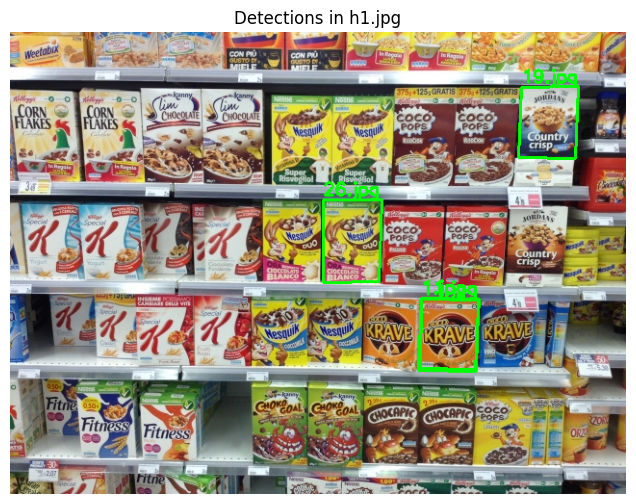

Product 1.jpg: inliers=20, center=(456.7,313.3), w=60.7px, h=74.4px
Product 11.jpg: inliers=15, center=(455.8,315.0), w=61.6px, h=75.2px
Product 19.jpg: inliers=24, center=(559.6,94.1), w=61.6px, h=74.7px
Product 26.jpg: inliers=15, center=(356.0,217.4), w=61.2px, h=85.9px


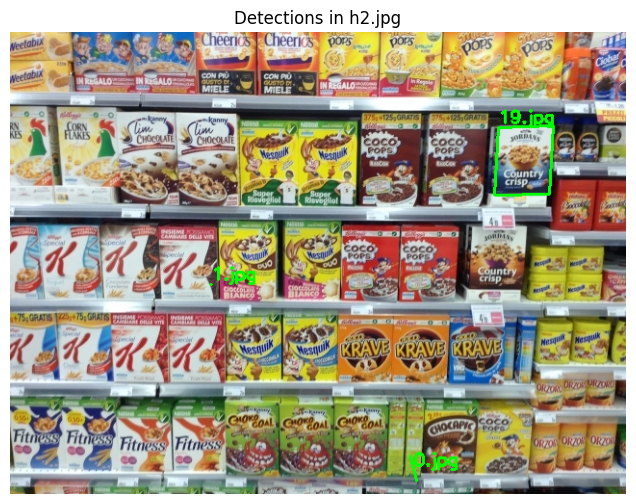

Product 0.jpg: inliers=53, center=(419.7,453.7), w=6.4px, h=25.4px
Product 1.jpg: inliers=15, center=(209.0,262.8), w=0.2px, h=0.0px
Product 19.jpg: inliers=21, center=(533.7,133.5), w=60.9px, h=71.2px


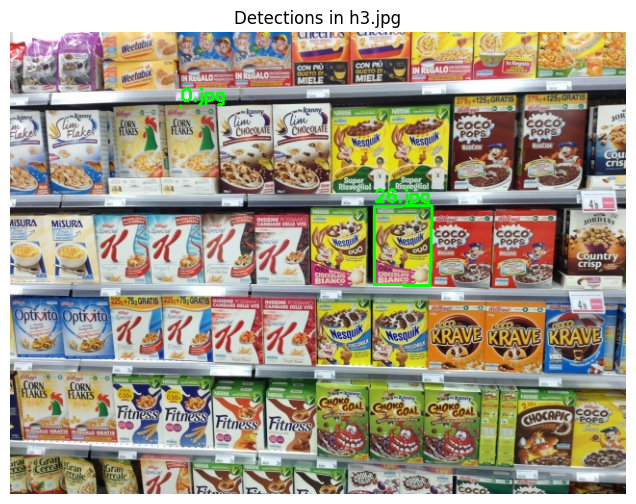

Product 0.jpg: inliers=21, center=(177.4,77.0), w=0.0px, h=0.2px
Product 26.jpg: inliers=19, center=(408.4,221.9), w=60.0px, h=82.3px


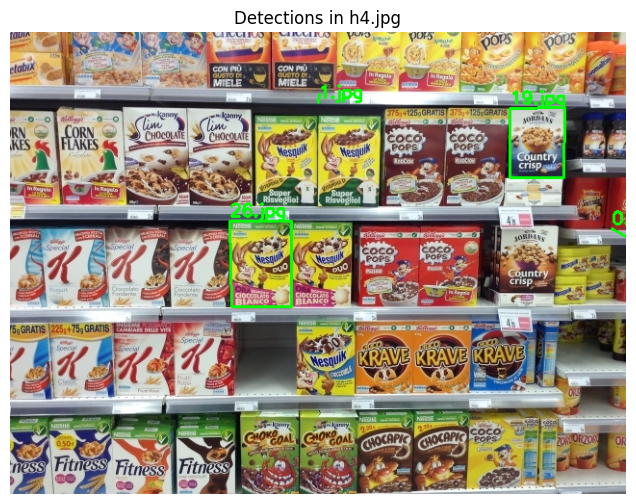

Product 0.jpg: inliers=24, center=(653.3,220.3), w=55.5px, h=31.0px
Product 1.jpg: inliers=20, center=(320.9,69.2), w=0.5px, h=8.7px
Product 19.jpg: inliers=24, center=(548.0,115.0), w=57.5px, h=73.3px
Product 26.jpg: inliers=21, center=(260.5,241.0), w=64.6px, h=89.6px


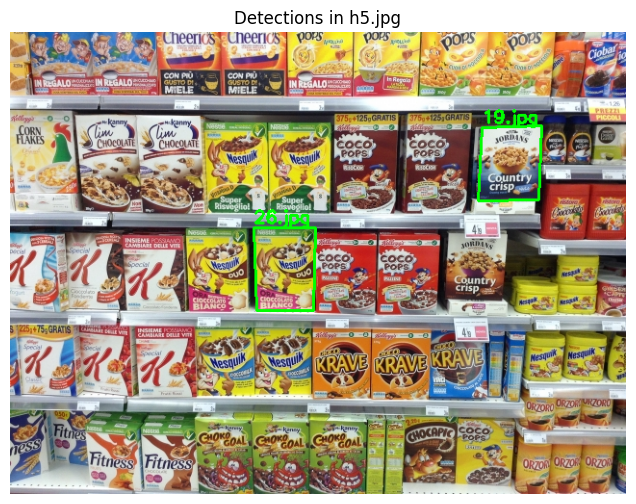

Product 19.jpg: inliers=37, center=(519.6,136.5), w=66.3px, h=77.7px
Product 26.jpg: inliers=22, center=(285.6,246.2), w=63.4px, h=86.0px


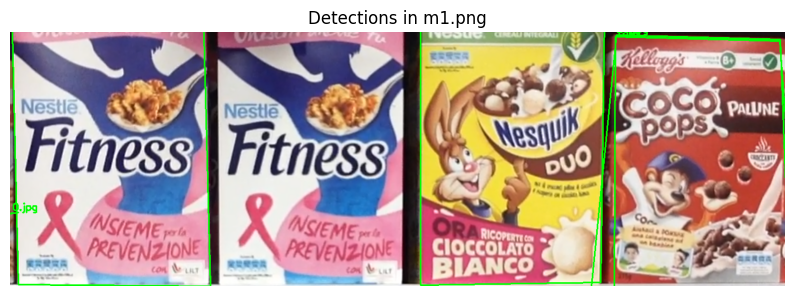

Product 0.jpg: inliers=89, center=(7.8,333.6), w=15.0px, h=1.6px
Product 1.jpg: inliers=32, center=(1278.7,243.7), w=337.2px, h=466.0px
Product 24.jpg: inliers=116, center=(185.9,213.5), w=364.5px, h=507.4px
Product 25.jpg: inliers=157, center=(1247.6,277.6), w=373.5px, h=540.9px
Product 26.jpg: inliers=272, center=(923.6,219.3), w=337.9px, h=491.5px


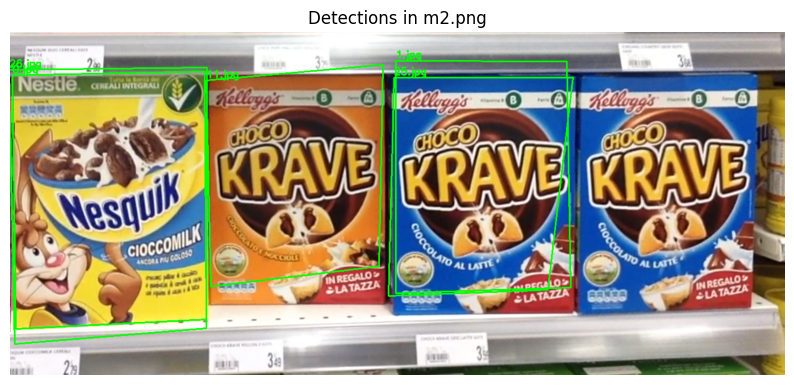

Product 0.jpg: inliers=308, center=(178.3,302.7), w=347.8px, h=460.7px
Product 1.jpg: inliers=29, center=(849.5,261.2), w=314.6px, h=415.8px
Product 11.jpg: inliers=29, center=(510.6,259.0), w=316.8px, h=396.4px
Product 25.jpg: inliers=16, center=(845.3,279.2), w=331.2px, h=391.1px
Product 26.jpg: inliers=58, center=(175.2,313.4), w=356.2px, h=495.0px


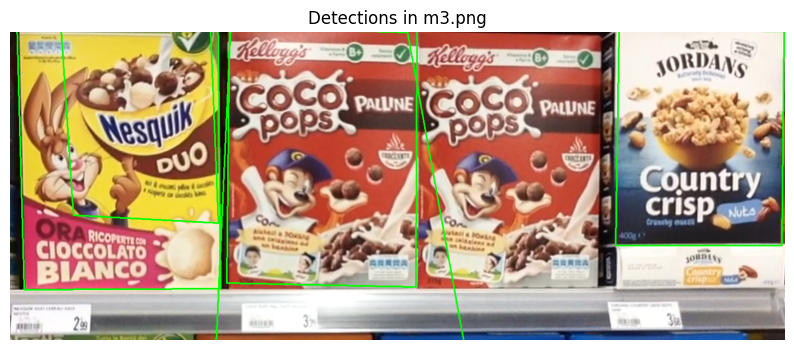

Product 0.jpg: inliers=51, center=(231.2,156.9), w=282.1px, h=371.3px
Product 1.jpg: inliers=22, center=(590.0,297.1), w=446.1px, h=609.4px
Product 19.jpg: inliers=213, center=(1232.9,189.0), w=301.8px, h=386.4px
Product 25.jpg: inliers=83, center=(557.7,223.1), w=340.5px, h=466.8px
Product 26.jpg: inliers=309, center=(193.7,206.3), w=364.8px, h=511.5px


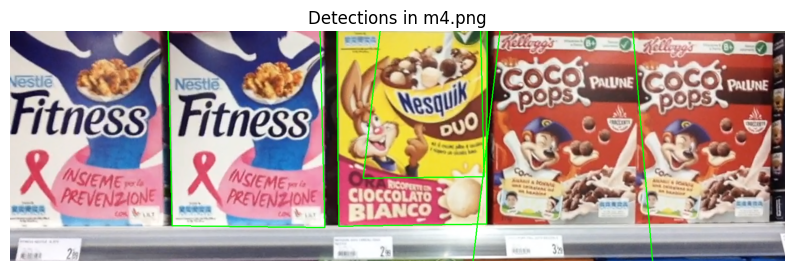

Product 0.jpg: inliers=37, center=(947.8,165.7), w=277.2px, h=341.2px
Product 24.jpg: inliers=95, center=(541.4,196.3), w=360.5px, h=505.7px
Product 25.jpg: inliers=55, center=(1267.0,267.0), w=414.6px, h=564.0px
Product 26.jpg: inliers=223, center=(921.3,196.7), w=345.4px, h=499.2px


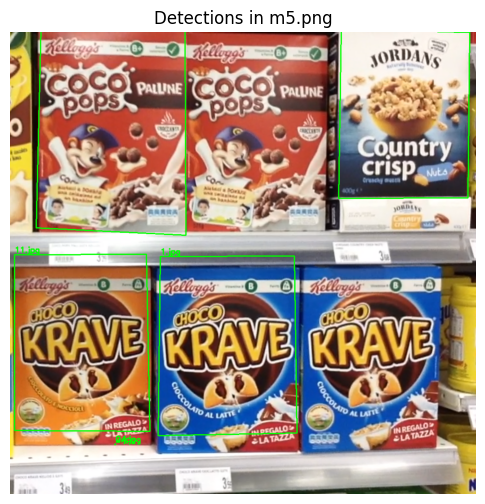

Product 0.jpg: inliers=64, center=(242.4,950.4), w=2.0px, h=1.2px
Product 1.jpg: inliers=35, center=(501.3,723.4), w=320.3px, h=413.5px
Product 11.jpg: inliers=20, center=(166.4,716.6), w=312.4px, h=408.8px
Product 19.jpg: inliers=195, center=(908.7,189.5), w=302.0px, h=387.8px
Product 24.jpg: inliers=16, center=(243.6,950.4), w=0.1px, h=0.1px
Product 25.jpg: inliers=49, center=(232.9,229.6), w=345.1px, h=477.2px


In [50]:
# 5. Run on all scenes
for scene_file in sorted(os.listdir(SCENE_DIR)):
    if not scene_file.lower().endswith(('.png','.jpg','.jpeg')):
        continue

    scene_path = os.path.join(SCENE_DIR, scene_file)
    scene = cv2.imread(scene_path)
    disp  = scene.copy()

    # store best detection per reference
    best = {}  # ref_file -> (inliers, center, (w,h), corners)

    for ref_file in REF_FILES:
        ref_img = cv2.imread(os.path.join(REF_DIR, ref_file))
        result = detect_instances(ref_img, scene)
        if result:
            center, dims, corners, inliers = result
            # keep only the detection with more inliers
            if ref_file not in best or inliers > best[ref_file][0]:
                best[ref_file] = (inliers, center, dims, corners)

    # draw bounding‐boxes for the best detections
    for ref_file, (inliers, center, (w_box, h_box), corners) in best.items():
        pts = corners.reshape(-1,1,2).astype(int)
        cv2.polylines(disp, [pts], True, (0,255,0), 2)
        # label at top‐left corner of box
        x0, y0 = pts[0][0]
        cv2.putText(disp, ref_file, (x0, y0-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    # show image
    plt.figure(figsize=(10,6))
    plt.title(f"Detections in {scene_file}")
    plt.axis('off')
    plt.imshow(cv2.cvtColor(disp, cv2.COLOR_BGR2RGB))
    plt.show()

    # print summary
    for ref_file, (inliers, center, dims, _) in best.items():
        cx, cy = center
        w_box, h_box = dims
        print(f"Product {ref_file}: inliers={inliers}, "
              f"center=({cx:.1f},{cy:.1f}), "
              f"w={w_box:.1f}px, h={h_box:.1f}px")
